# Number Plate Photo Renamer

Этот ноутбук используется для быстрой демонстрации и проверки проекта.
Основная логика реализована в отдельных файлах проекта (`main.py`, `detector.py`, `recognizer.py`, `renamer.py`, `reporter.py`, `app_streamlit.py`).

В ноутбуке показаны:
- импорт модулей проекта;
- проверка обработки одного изображения;
- запуск CLI-пайплайна;
- просмотр отчётов;
- запуск Streamlit;
- запуск Docker-версии приложения.



## 1. Импорты и подготовка окружения

Подключаем модули проекта и задаём пути к тестовым изображениям.

In [52]:
import sys
import os
import cv2
import pytesseract
import pandas as pd
import main
import importlib
import subprocess
import socket

from main import process_one_file
from src.renamer import build_new_name
from pathlib import Path
from PIL import Image
from IPython.display import display


print(sys.executable)

%pip show pytesseract

C:\Users\maxim\anaconda3\envs\graves_cv\python.exe
Name: pytesseract
Version: 0.3.13
Summary: Python-tesseract is a python wrapper for Google's Tesseract-OCR
Home-page: https://github.com/madmaze/pytesseract
Author: Samuel Hoffstaetter
Author-email: samuel@hoffstaetter.com
License: Apache License 2.0
Location: C:\Users\maxim\anaconda3\envs\graves_cv\Lib\site-packages
Requires: packaging, Pillow
Required-by: 
Note: you may need to restart the kernel to use updated packages.


In [53]:
%pip install pytesseract

Note: you may need to restart the kernel to use updated packages.


In [54]:
print(cv2.__version__)
print("pytesseract ok")

4.11.0
pytesseract ok


In [55]:
%cd C:\Users\maxim\number_recognition_project

C:\Users\maxim\number_recognition_project


In [56]:
project_dir = Path.cwd()
project_dir

WindowsPath('C:/Users/maxim/number_recognition_project')

In [57]:

pytesseract.pytesseract.tesseract_cmd = r"C:\Program Files\Tesseract-OCR\tesseract.exe"
print(pytesseract.get_tesseract_version())

5.5.0.20241111


## 2. Проверка обработки одного изображения

На этом этапе прогоняем одно фото через весь пайплайн и смотрим,
какой результат получается на выходе:
- найдена ли табличка;
- что вернул OCR;
- валиден ли результат;
- какое новое имя предлагается.

In [58]:

image_path = Path('input_photos/QBA0030.JPG')
result = process_one_file(image_path, debug_dir=Path('debug_output'))
result

{'old_name': 'QBA0030.JPG',
 'ocr_raw': 'a',
 'normalized_text': 'a',
 'parsed_value': None,
 'new_name': None,
 'status': 'error',
 'error_reason': 'формат должен быть: 1-4 цифры и необязательная буква',
 'confidence': 18.0,
 'low_confidence': True}

In [59]:
#print("Notebook cwd:", Path.cwd())
#print("Notebook input_photos:", Path("input_photos").resolve())
#print("Python executable:", sys.executable)

In [60]:
#from pathlib import Path
#project_dir = Path("main.py").resolve().parent
#print("main.py project_dir:", project_dir)
#print("main.py default input_dir:", (project_dir / "input_photos").resolve())

In [61]:
print("Files from notebook input_photos:")
for p in sorted(Path("input_photos").glob("*")):
    print(" ", p.name)

print("\nFiles from main.py input_photos:")
for p in sorted((Path("main.py").resolve().parent / "input_photos").glob("*")):
    print(" ", p.name)

Files from notebook input_photos:
  QBA0030.JPG
  QBA0052b_1.JPG
  QBA0058.JPG
  QBA0065.JPG
  QBA0071a.JPG
  QBA0078.JPG
  QBA0093.JPG
  TUL895.JPG

Files from main.py input_photos:
  QBA0030.JPG
  QBA0052b_1.JPG
  QBA0058.JPG
  QBA0065.JPG
  QBA0071a.JPG
  QBA0078.JPG
  QBA0093.JPG
  TUL895.JPG


## 3. Внутри main.py делаем действия:
1) Проверка обработки одного изображения

    На этом этапе прогоняем одно фото через весь пайплайн и смотрим,
    какой результат получается на выходе:
        - найдена ли табличка;
        - что вернул OCR;
        - валиден ли результат;
        - какое новое имя предлагается.

2) Детекция таблички

    Здесь отдельно проверяется, может ли текущий детектор найти табличку на изображении
    и корректно вырезать область для OCR.

3) OCR-распознавание

    На этом этапе проверяется распознавание текста на уже вырезанной области таблички.
    Это помогает отдельно анализировать качество OCR без влияния логики переименования.


4) Нормализация и валидация результата

    После OCR текст очищается, приводится к нужному формату и проверяется
    на соответствие правилам проекта:
        - 1–4 цифры;
        - необязательная буква a-e в конце.

5) Проверка логики переименования

    Здесь отдельно проверяются правила формирования имени файла:
    - дополнение нулями;
    - сохранение буквенного суффикса;
    - добавление `_1`, `_2` для дублей;
    - добавление `-!` для low-confidence случаев.
    
6) Пакетная обработка папки

    На этом этапе проверяется обработка сразу нескольких изображений:
    - формирование списка результатов;
    - сводка по valid / low-confidence / error;
    - подготовка к dry-run или apply.

In [62]:
!python main.py

Renamed files: 2
Low-confidence files: 4
Unrenamed files: 6

Low-confidence list:
 - QBA0030.JPG
 - QBA0052b_1.JPG
 - QBA0058.JPG
 - QBA0065.JPG

Unrenamed list:
 - QBA0030.JPG
 - QBA0052b_1.JPG
 - QBA0065.JPG
 - QBA0071a.JPG
 - QBA0078.JPG
 - TUL895.JPG

Mode: dry-run
CSV: C:\Users\maxim\number_recognition_project\report.csv
Excel: C:\Users\maxim\number_recognition_project\report.xlsx
Summary: C:\Users\maxim\number_recognition_project\summary_report.txt


In [63]:
!{sys.executable} main.py --input-dir "input_photos" --dry-run

Renamed files: 2
Low-confidence files: 4
Unrenamed files: 6

Low-confidence list:
 - QBA0030.JPG
 - QBA0052b_1.JPG
 - QBA0058.JPG
 - QBA0065.JPG

Unrenamed list:
 - QBA0030.JPG
 - QBA0052b_1.JPG
 - QBA0065.JPG
 - QBA0071a.JPG
 - QBA0078.JPG
 - TUL895.JPG

Mode: dry-run
CSV: C:\Users\maxim\number_recognition_project\report.csv
Excel: C:\Users\maxim\number_recognition_project\report.xlsx
Summary: C:\Users\maxim\number_recognition_project\summary_report.txt


**отчёт**

In [64]:
df = pd.read_csv("report.csv")
df

,old_name,ocr_raw,normalized_text,parsed_value,new_name,status,error_reason,confidence,low_confidence,rename_done,rename_comment,formatted_base_name
0,QBA0030.JPG,a,a,NaN,NaN,error,формат должен быть: 1-4 цифры и необязательная...,18.0,True,False,не переименован,NaN
1,QBA0052b_1.JPG,aa,aa,NaN,NaN,error,формат должен быть: 1-4 цифры и необязательная...,59.0,True,False,не переименован,NaN
2,QBA0058.JPG,58,58,58.0,0058-!.jpg,ok,NaN,18.0,True,False,План: QBA0058.JPG -> 0058-!.jpg,58.0
3,QBA0065.JPG,ee,ee,NaN,NaN,error,формат должен быть: 1-4 цифры и необязательная...,12.0,True,False,не переименован,NaN
4,QBA0071a.JPG,NaN,NaN,NaN,NaN,error,табличка не найдена,0.0,False,False,не переименован,NaN
5,QBA0078.JPG,eee,eee,NaN,NaN,error,формат должен быть: 1-4 цифры и необязательная...,NaN,False,False,не переименован,NaN
6,QBA0093.JPG,93,93,93.0,0093.jpg,ok,NaN,NaN,False,False,План: QBA0093.JPG -> 0093.jpg,93.0
7,TUL895.JPG,eae,eae,NaN,NaN,error,формат должен быть: 1-4 цифры и необязательная...,NaN,False,False,не переименован,NaN


In [65]:
df[["old_name", "new_name", "confidence", "low_confidence", "status"]]

,old_name,new_name,confidence,low_confidence,status
0,QBA0030.JPG,NaN,18.0,True,error
1,QBA0052b_1.JPG,NaN,59.0,True,error
2,QBA0058.JPG,0058-!.jpg,18.0,True,ok
3,QBA0065.JPG,NaN,12.0,True,error
4,QBA0071a.JPG,NaN,0.0,False,error
5,QBA0078.JPG,NaN,NaN,False,error
6,QBA0093.JPG,0093.jpg,NaN,False,ok
7,TUL895.JPG,NaN,NaN,False,error


In [66]:
df[df["low_confidence"] == True][["old_name", "new_name", "confidence", "status"]]


,old_name,new_name,confidence,status
0,QBA0030.JPG,NaN,18.0,error
1,QBA0052b_1.JPG,NaN,59.0,error
2,QBA0058.JPG,0058-!.jpg,18.0,ok
3,QBA0065.JPG,NaN,12.0,error


In [67]:
df[df["status"] == "error"]

,old_name,ocr_raw,normalized_text,parsed_value,new_name,status,error_reason,confidence,low_confidence,rename_done,rename_comment,formatted_base_name
0,QBA0030.JPG,a,a,NaN,NaN,error,формат должен быть: 1-4 цифры и необязательная...,18.0,True,False,не переименован,NaN
1,QBA0052b_1.JPG,aa,aa,NaN,NaN,error,формат должен быть: 1-4 цифры и необязательная...,59.0,True,False,не переименован,NaN
3,QBA0065.JPG,ee,ee,NaN,NaN,error,формат должен быть: 1-4 цифры и необязательная...,12.0,True,False,не переименован,NaN
4,QBA0071a.JPG,NaN,NaN,NaN,NaN,error,табличка не найдена,0.0,False,False,не переименован,NaN
5,QBA0078.JPG,eee,eee,NaN,NaN,error,формат должен быть: 1-4 цифры и необязательная...,NaN,False,False,не переименован,NaN
7,TUL895.JPG,eae,eae,NaN,NaN,error,формат должен быть: 1-4 цифры и необязательная...,NaN,False,False,не переименован,NaN


In [68]:
!{sys.executable} main.py --input-dir input_photos_Copy --apply

Renamed files: 2
Low-confidence files: 4
Unrenamed files: 6

Low-confidence list:
 - 0058-!.jpg
 - QBA0030.JPG
 - QBA0052b_1.JPG
 - QBA0065.JPG

Unrenamed list:
 - QBA0030.JPG
 - QBA0052b_1.JPG
 - QBA0065.JPG
 - QBA0071a.JPG
 - QBA0078.JPG
 - TUL895.JPG

Mode: apply
CSV: C:\Users\maxim\number_recognition_project\report.csv
Excel: C:\Users\maxim\number_recognition_project\report.xlsx
Summary: C:\Users\maxim\number_recognition_project\summary_report.txt


In [69]:
for p in sorted(Path("input_photos_Copy").iterdir()):
    print(p.name)

0058-!.jpg
0093.jpg
QBA0030.JPG
QBA0052b_1.JPG
QBA0065.JPG
QBA0071a.JPG
QBA0078.JPG
TUL895.JPG


**Примеры отображении**

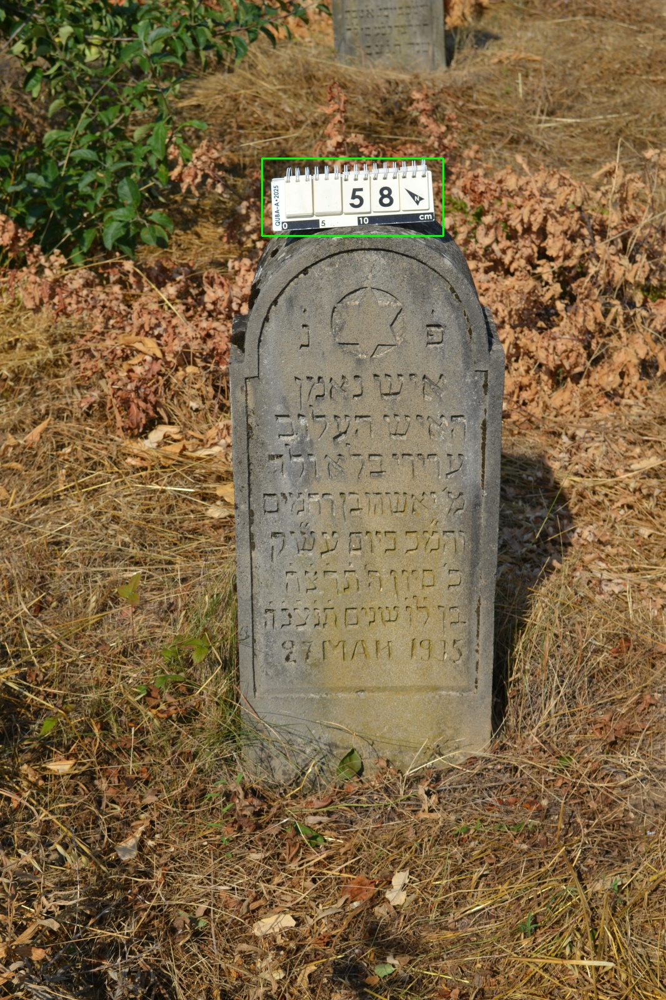

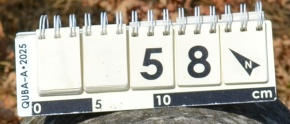

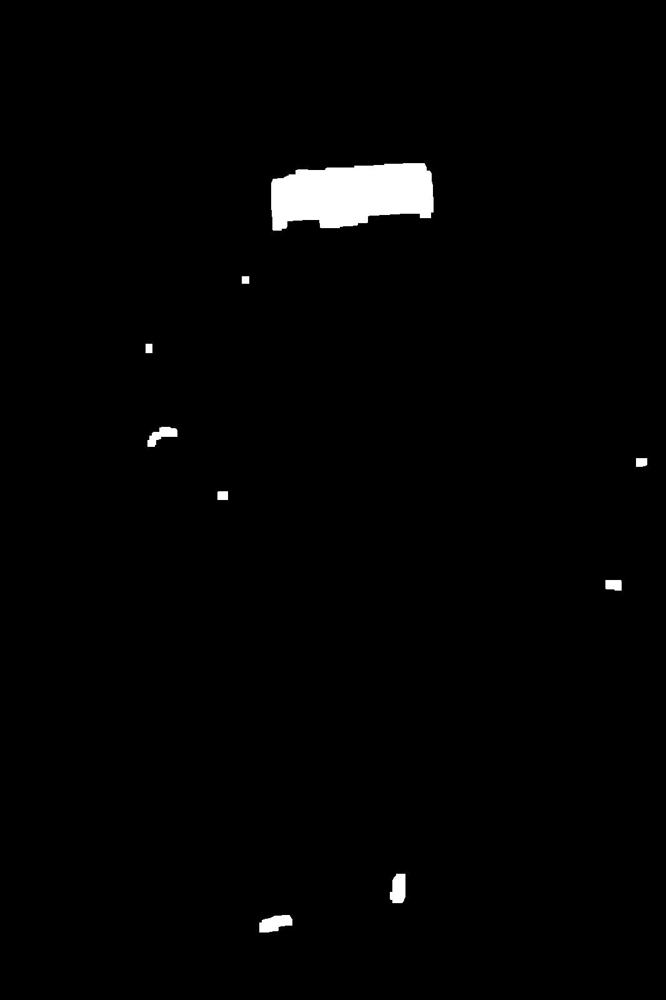

In [71]:


display(Image.open("debug_output/QBA0058_detected_box.jpg"))
display(Image.open("debug_output/QBA0058_crop.jpg"))
display(Image.open("debug_output/QBA0058_processed.jpg"))

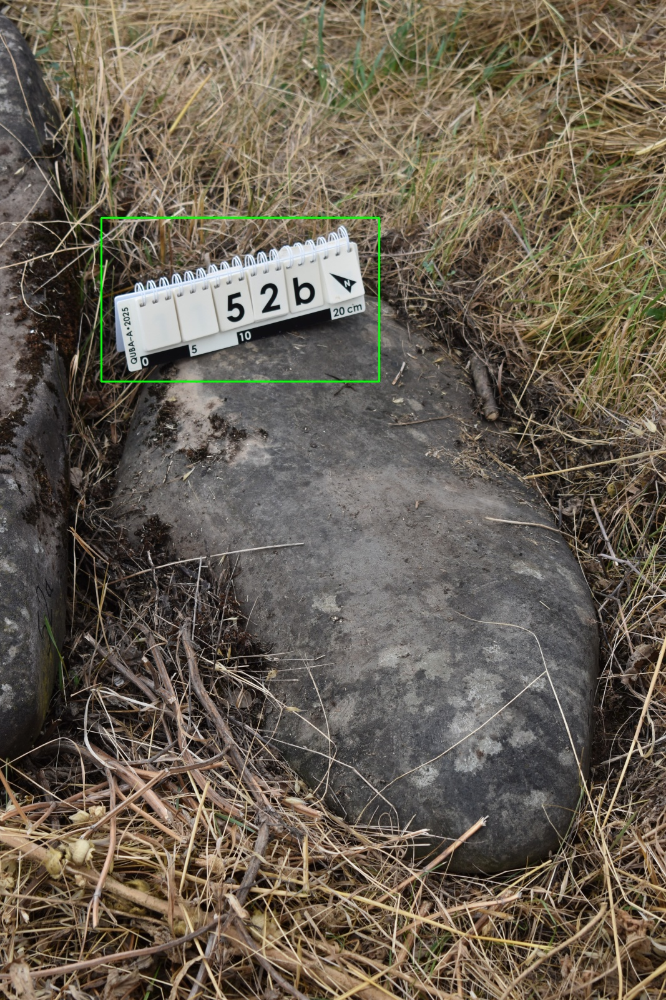

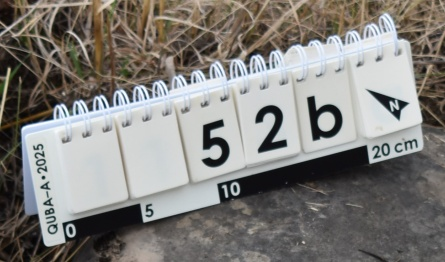

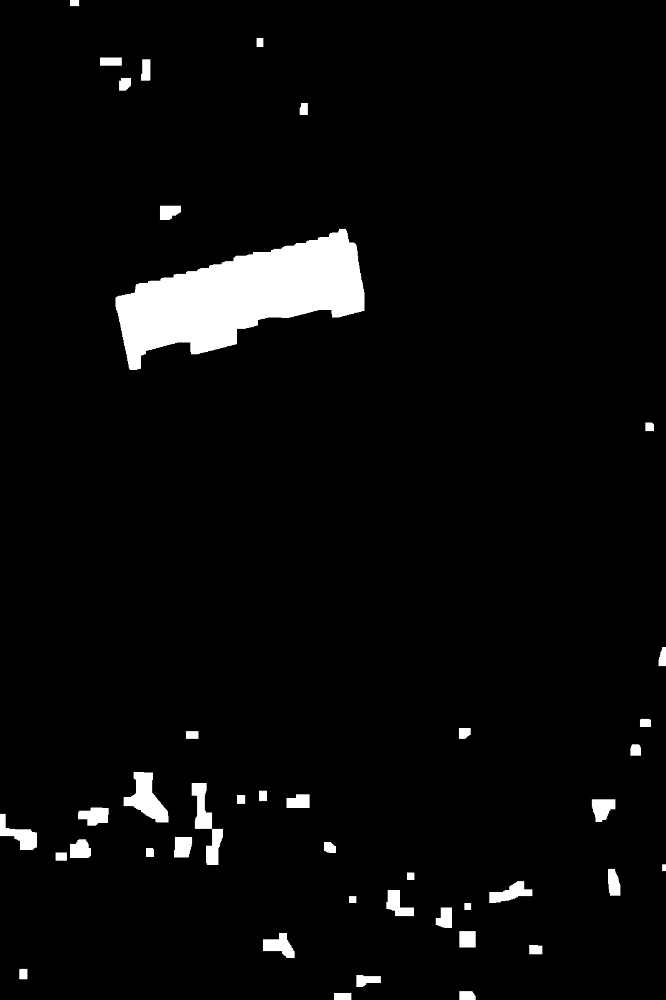

In [72]:
display(Image.open("debug_output/QBA0052b_1_detected_box.jpg"))
display(Image.open("debug_output/QBA0052b_1_crop.jpg"))
display(Image.open("debug_output/QBA0052b_1_processed.jpg"))

**Устанавливаем и настраиваем streamlit**

In [73]:
!{sys.executable} -m pip install streamlit

In [74]:
print(Path("app_streamlit.py").exists())

True


In [75]:
cfg_dir = Path(".streamlit")
cfg_dir.mkdir(exist_ok=True)

(cfg_dir / "config.toml").write_text(
    """
[server]
showEmailPrompt = false

[browser]
gatherUsageStats = false
""".strip(),
    encoding="utf-8",
)

print((cfg_dir / "config.toml").resolve())
print((cfg_dir / "config.toml").read_text(encoding="utf-8"))

C:\Users\maxim\number_recognition_project\.streamlit\config.toml
[server]
showEmailPrompt = false

[browser]
gatherUsageStats = false


In [76]:
log_path = Path("streamlit.log")

proc = subprocess.Popen(
    [
        sys.executable,
        "-m",
        "streamlit",
        "run",
        "app_streamlit.py",
        "--server.address",
        "127.0.0.1",
        "--server.port",
        "8502",
    ],
    stdout=log_path.open("w", encoding="utf-8"),
    stderr=subprocess.STDOUT,
    cwd=str(Path.cwd()),
)

print("PID:", proc.pid)
print("Open: http://127.0.0.1:8502")
print("Log:", log_path.resolve())

PID: 20396
Open: http://127.0.0.1:8502
Log: C:\Users\maxim\number_recognition_project\streamlit.log


**Настраиваем Docker**

In [77]:
!docker --version
!docker compose version

Docker version 29.3.1, build c2be9cc
Docker Compose version v5.1.0


In [ ]:
!docker compose build --no-cache
!docker compose up -d
!docker compose ps

## 7. Выводы

По итогам ноутбука можно проверить, что:
- основной пайплайн работает;
- детекция и OCR дают ожидаемый результат на тестовых примерах;
- логика переименования соответствует правилам проекта;
- проблемные случаи можно отдельно анализировать до запуска CLI или Streamlit.

Этот ноутбук не является основным интерфейсом проекта, а используется
для демонстрации и отладки промежуточных шагов.